In [1]:
!pip install kneed

In [2]:
!pip install numpy
!pip install pandas
!pip install matplotlib
!pip install seaborn
!pip install sklearn
!pip install plotly

In [3]:
import warnings
warnings.filterwarnings("ignore")
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn import preprocessing
from sklearn.preprocessing import StandardScaler
from sklearn import metrics
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots
from sklearn.metrics.pairwise import pairwise_distances_argmin
from sklearn.cluster import KMeans
from kneed import KneeLocator
from sklearn.metrics import silhouette_score

In [4]:
Data1 = pd.read_csv("C:/Users/Admin/Desktop/1- mental-illnesses-prevalence.csv")

In [5]:
df = pd.DataFrame(Data1)

In [6]:
def describe(df):
      
    variables = []
    dtypes = []
    count = []
    unique = []
    missing = []
     
    for item in df.columns:
        variables.append(item)
        dtypes.append(df[item].dtype)
        count.append(len(df[item]))
        unique.append(len(df[item].unique()))
        missing.append(df[item].isna().sum())
        

    output = pd.DataFrame({
        'variable': variables, 
        'dtype': dtypes,
        'count': count,
        'unique': unique,
        'missing value': missing
    })    
        
    return output

In [7]:
df = df.rename(columns={'Schizophrenia disorders (share of population) - Sex: Both - Age: Age-standardized': 'Schizophrenia', 
                          'Depressive disorders (share of population) - Sex: Both - Age: Age-standardized': 'Depressive',
                         'Anxiety disorders (share of population) - Sex: Both - Age: Age-standardized':'Anxiety',
                         'Bipolar disorders (share of population) - Sex: Both - Age: Age-standardized':'Bipolar',
                         'Eating disorders (share of population) - Sex: Both - Age: Age-standardized':'Eating'})


In [15]:
class color:
   BLUE = '\033[94m'
   BOLD = '\033[1m'
   UNDERLINE = '\033[4m'
   END = '\033[0m'

In [16]:
print(color.BOLD + color.BLUE + color.UNDERLINE +
      'Mental illness dataframe' + color.END)
print(describe(df))

Mental illness dataframe
        variable    dtype  count  unique  missing value
0         Entity   object   6420     214              0
1           Code   object   6420     206            270
2           Year    int64   6420      30              0
3  Schizophrenia  float64   6420    6406              0
4     Depressive  float64   6420    6416              0
5        Anxiety  float64   6420    6417              0
6        Bipolar  float64   6420    6385              0
7         Eating  float64   6420    6417              0


In [17]:
df

,Entity,Code,Year,Schizophrenia,Depressive,Anxiety,Bipolar,Eating
0,Afghanistan,AFG,1990,0.223206,4.996118,4.713314,0.703023,0.127700
1,Afghanistan,AFG,1991,0.222454,4.989290,4.702100,0.702069,0.123256
2,Afghanistan,AFG,1992,0.221751,4.981346,4.683743,0.700792,0.118844
3,Afghanistan,AFG,1993,0.220987,4.976958,4.673549,0.700087,0.115089
4,Afghanistan,AFG,1994,0.220183,4.977782,4.670810,0.699898,0.111815
...,...,...,...,...,...,...,...,...
6415,Zimbabwe,ZWE,2015,0.201042,3.407624,3.184012,0.538596,0.095652
6416,Zimbabwe,ZWE,2016,0.201319,3.410755,3.187148,0.538593,0.096662
6417,Zimbabwe,ZWE,2017,0.201639,3.411965,3.188418,0.538589,0.097330
6418,Zimbabwe,ZWE,2018,0.201976,3.406929,3.172111,0.538585,0.097909


In [18]:
fig1 = px.scatter(df, x="Schizophrenia", y="Depressive", color="Anxiety", marginal_y="violin",
           marginal_x="box", trendline="ols", template="simple_white")
fig1.show()
fig2 = px.scatter(df, x="Depressive", y="Anxiety", color="Bipolar", marginal_y="violin",
           marginal_x="box", trendline="ols", template="simple_white")
fig2.show()
fig3 = px.scatter(df, x="Anxiety", y="Bipolar", color="Eating", marginal_y="violin",
           marginal_x="box", trendline="ols", template="simple_white")
fig3.show()
fig4 = px.scatter(df, x="Bipolar", y="Eating", color="Schizophrenia", marginal_y="violin",
           marginal_x="box", trendline="ols", template="simple_white")
fig4.show()

In [19]:
fig = px.scatter_matrix(df, dimensions=["Schizophrenia", "Depressive", "Anxiety", 
                                        "Bipolar"], color="Eating")
fig.show()

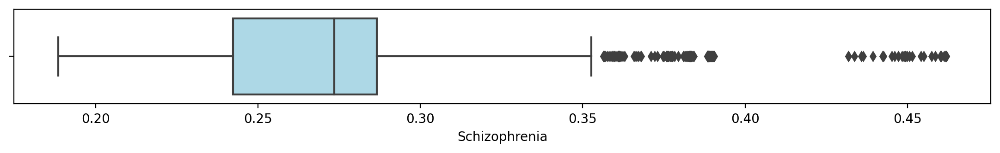

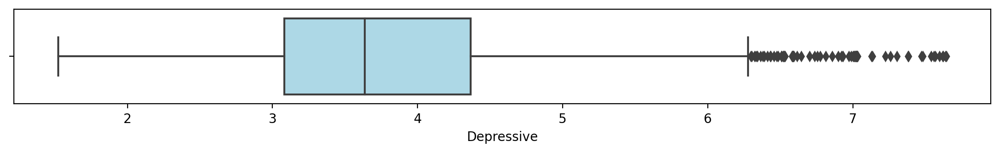

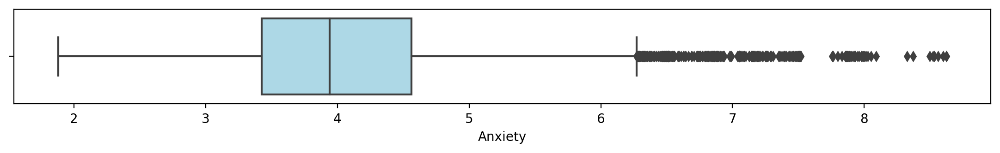

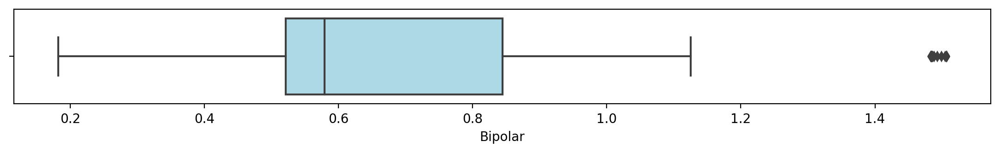

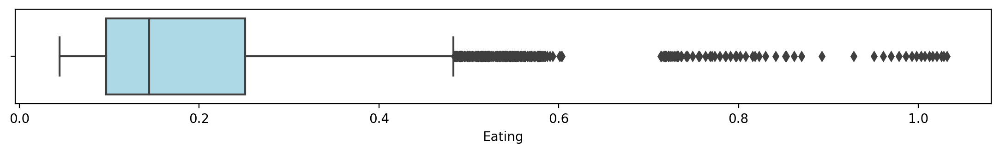

In [20]:
Numerical = ['Schizophrenia', 'Depressive','Anxiety','Bipolar','Eating']
i = 0
while i < 5:
    fig = plt.figure(figsize = [30,3], dpi=200)
    plt.subplot(2,2,1)
    sns.boxplot(x = Numerical[i], data = df,
           boxprops = dict(facecolor = "lightblue"))
    i += 1
    plt.show()

<AxesSubplot:>

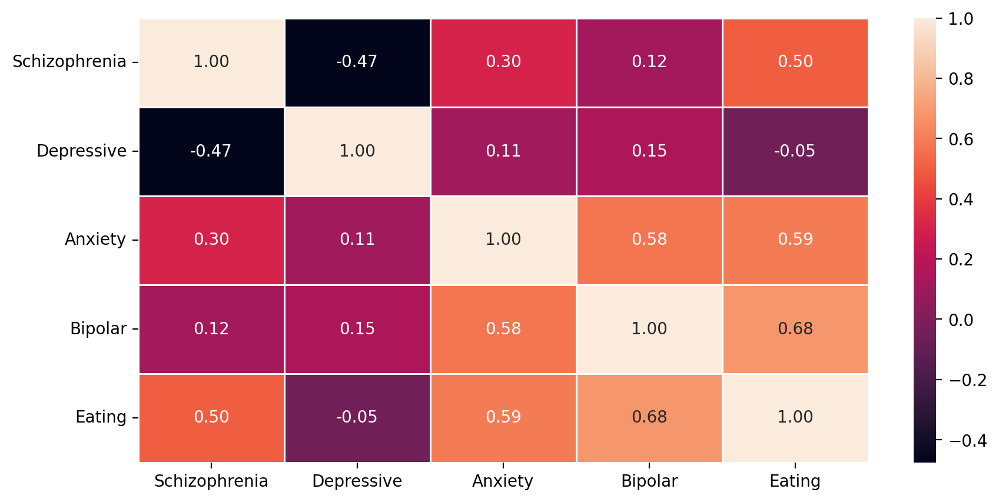

In [21]:
Corrmat = df[Numerical].corr()
plt.figure(figsize=(10, 5), dpi=200)
sns.heatmap(Corrmat, annot=True,fmt=".2f", linewidth=.5)

In [22]:
features = ['Schizophrenia', 'Depressive','Anxiety','Bipolar','Eating']

In [23]:
kmeans = KMeans(
init="random",
n_clusters=3,
n_init=10,
max_iter=300,
random_state=42)

In [24]:
cluster_km = kmeans.fit(df[features])

In [25]:
cluster_km.inertia_

5264.336621759868

In [26]:
cluster_km.cluster_centers_

array([[0.23647181, 4.71686437, 3.85629856, 0.63624499, 0.15052616],
       [0.27844532, 3.09059344, 3.62023544, 0.53714676, 0.15449974],
       [0.292419  , 3.73637564, 5.80532637, 0.89614548, 0.38646993]])

In [27]:
kmeans_kw = {
    "init": "random",
    "n_init": 10,
    "max_iter": 300,
    "random_state": 42,
}

In [28]:
iner = []
for k in range (1,10):
    kmeans = KMeans(n_clusters=k, **kmeans_kw)
    kmeans.fit(df[features])
    iner.append(kmeans.inertia_)

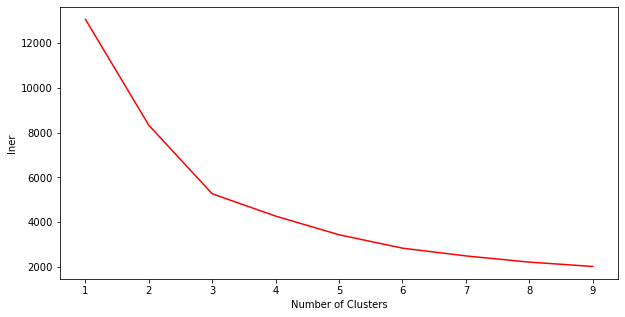

In [30]:
plt.figure(figsize=(10,5))
plt.plot(range(1, 10), iner, color='red')
plt.xticks(range(1, 10))
plt.xlabel("Number of Clusters")
plt.ylabel("Iner")
plt.show()

In [31]:
KL = KneeLocator(range(1,10), iner, curve="convex", direction= "decreasing")
KL.elbow

3

In [32]:
silhouette_coefficients = []

for k in range(2, 11):
    kmeans = KMeans(n_clusters=k, **kmeans_kw)
    kmeans.fit(df[features])
    score = silhouette_score(df[features], kmeans.labels_)
    silhouette_coefficients.append(score)

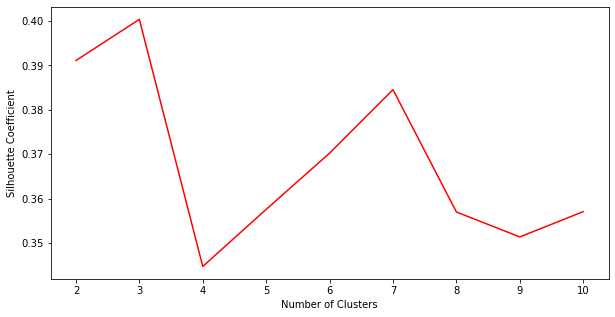

In [33]:
plt.figure(figsize=(10,5))
plt.plot(range(2, 11), silhouette_coefficients, color='red')
plt.xticks(range(2, 11))
plt.xlabel("Number of Clusters")
plt.ylabel("Silhouette Coefficient")
plt.show()

In [34]:
kmeans = KMeans(n_clusters=3)
kmeans.fit(df[features])
labels_Km = kmeans.labels_

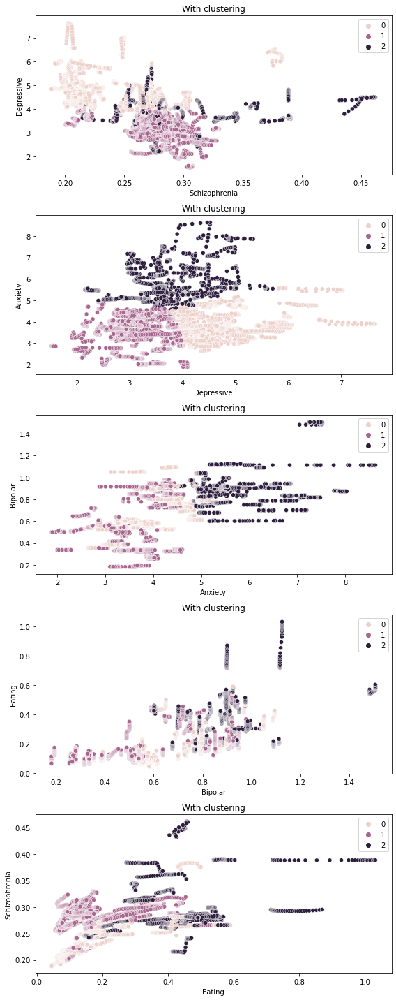

In [38]:
fig, axes = plt.subplots(nrows=5, ncols=1, figsize=(8, 20))

sns.scatterplot(ax=axes[0], data=df, x='Schizophrenia', y='Depressive', hue=labels_Km).set_title('With clustering');
sns.scatterplot(ax=axes[1], data=df, x='Depressive', y='Anxiety', hue=labels_Km).set_title('With clustering');
sns.scatterplot(ax=axes[2], data=df, x='Anxiety', y='Bipolar', hue=labels_Km).set_title('With clustering');
sns.scatterplot(ax=axes[3], data=df, x='Bipolar', y='Eating', hue=labels_Km).set_title('With clustering');
sns.scatterplot(ax=axes[4], data=df, x='Eating', y='Schizophrenia', hue=labels_Km).set_title('With clustering');

plt.tight_layout()
plt.show()

In [39]:
overlapped_data = []

for i in range(len(df[features])):
    current_label = kmeans.labels_[i]
    
    if i > 0 and i < len(df[features]) - 1:
        prev_label = kmeans.labels_[i - 1]
        next_label = kmeans.labels_[i + 1]
        
        if current_label != prev_label or current_label != next_label:
            overlapped_data.append(df.iloc[i])

overlapped_df = pd.DataFrame(overlapped_data)

print("Extracted Overlapped Data:")
print(overlapped_df)

Extracted Overlapped Data:
                 Entity      Code  Year  Schizophrenia  Depressive   Anxiety  \
59    Africa (IHME GBD)       NaN  2019       0.221209    4.462034  3.699605   
60              Albania       ALB  1990       0.281197    2.381431  3.659145   
89              Albania       ALB  2019       0.287501    2.460203  3.837537   
90              Algeria       DZA  1990       0.250219    4.252146  4.626097   
119             Algeria       DZA  2019       0.249135    4.129681  4.771976   
...                 ...       ...   ...            ...         ...       ...   
6180         Uzbekistan       UZB  1990       0.264840    3.322635  2.022093   
6329              World  OWID_WRL  2019       0.287409    3.440053  3.779522   
6330              Yemen       YEM  1990       0.231505    4.857035  4.771015   
6389             Zambia       ZMB  2019       0.212869    4.219490  3.969207   
6390           Zimbabwe       ZWE  1990       0.206947    3.308466  3.145761   

       Bipol

In [40]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score

features = ['Schizophrenia','Anxiety', 'Bipolar', 'Eating']
target = 'Depressive'


X_train, X_test, y_train, y_test = train_test_split(overlapped_df[features], overlapped_df[target], test_size=0.2, random_state=42)
linear_reg = LinearRegression()
linear_reg.fit(X_train, y_train)
y_pred = linear_reg.predict(X_test)

mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print("Mean Squared Error:", mse)
print("R-squared (R2) Score:", r2)


Mean Squared Error: 0.5640705195751908
R-squared (R2) Score: -0.04653467496278729


In [41]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix


features = ['Schizophrenia', 'Anxiety', 'Bipolar', 'Eating']
target = 'Depressive'

X = overlapped_df[features]
y = overlapped_df[target]


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
threshold = 0.5  
y_train_binary = (y_train > threshold).astype(int)
y_test_binary = (y_test > threshold).astype(int)
rf_classifier = RandomForestClassifier(n_estimators=100, random_state=42)
rf_classifier.fit(X_train, y_train_binary)
y_pred_binary = rf_classifier.predict(X_test)

print("Confusion Matrix:")
print(confusion_matrix(y_test_binary, y_pred_binary))
print("\nClassification Report:")
print(classification_report(y_test_binary, y_pred_binary))

Confusion Matrix:
[[69]]

Classification Report:
              precision    recall  f1-score   support

           1       1.00      1.00      1.00        69

    accuracy                           1.00        69
   macro avg       1.00      1.00      1.00        69
weighted avg       1.00      1.00      1.00        69



In [42]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import confusion_matrix, classification_report

bins = [0, 3, 6, float('inf')] 

labels = ['Low', 'Medium', 'High']

overlapped_df['Depressive_Category'] = pd.cut(overlapped_df['Depressive'], bins=bins, labels=labels, right=False)


features = ['Schizophrenia', 'Anxiety', 'Bipolar', 'Eating']
target = 'Depressive_Category'


X_train, X_test, y_train, y_test = train_test_split(overlapped_df[features], overlapped_df[target], test_size=0.2, random_state=42)
gb_classifier = GradientBoostingClassifier()
gb_classifier.fit(X_train, y_train)
y_pred = gb_classifier.predict(X_test)

conf_matrix = confusion_matrix(y_test, y_pred)
class_report = classification_report(y_test, y_pred)


print("Confusion Matrix:")
print(conf_matrix)
print("\nClassification Report:")
print(class_report)

Confusion Matrix:
[[ 3 11]
 [ 1 54]]

Classification Report:
              precision    recall  f1-score   support

         Low       0.75      0.21      0.33        14
      Medium       0.83      0.98      0.90        55

    accuracy                           0.83        69
   macro avg       0.79      0.60      0.62        69
weighted avg       0.81      0.83      0.79        69



In [50]:
print("Enter the values for the following features:")
schizophrenia = float(input("Schizophrenia: "))
anxiety = float(input("Anxiety: "))
bipolar = float(input("Bipolar: "))
eating = float(input("Eating: "))


user_input = pd.DataFrame({
    'Schizophrenia': [schizophrenia],
    'Anxiety': [anxiety],
    'Bipolar': [bipolar],
    'Eating': [eating]
})

predicted_category = gb_classifier.predict(user_input)
print("Predicted Depressive Category:", predicted_category[0])

Enter the values for the following features:
Schizophrenia: .221
Anxiety: 3.699
Bipolar: .61
Eating: .12
Predicted Depressive Category: Medium
